# Ross Sea synthetic gravity inversion

Here we try to recover the true bathymetry of the Ross Sea from a synthetic airborne gravity survey. See notebook `Ross_Sea_synthetic_model.ipynb` for the creation of this synthetic gravity data and the low-resolution starting model of bathymetry. 

import packages

In [46]:
from __future__ import annotations

%load_ext autoreload
%autoreload 2
%load_ext snakeviz

import copy
import logging
import os

import numpy as np
import pandas as pd
import seaborn as sns
import verde as vd
import xarray as xr
import zarr

sns.set_theme()


# local python scripts
from invert4geom import (
    cross_validation,
    inversion,
    optimization,
    plotting,
    synthetic,
    utils,
)
from polartoolkit import maps
from polartoolkit import utils as polar_utils

import RIS_gravity_inversion.plotting as RIS_plotting

os.environ["POLARTOOLKIT_HEMISPHERE"] = "north"

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
The snakeviz extension is already loaded. To reload it, use:
  %reload_ext snakeviz


# Load data

## topographic layers
* full resolution bed 
* low resolution bed

In [2]:
bed = xr.open_zarr("../../synthetic_data/Ross_Sea_bed.zarr").z

starting_bed = xr.open_zarr(
    "../../synthetic_data/Ross_Sea_lowres_bed_semiregular.zarr"
).z

# ensure all xarray are same data type
bed = bed.astype(np.float64)
starting_bed = starting_bed.astype(np.float64)

print(polar_utils.get_grid_info(bed))
print(polar_utils.get_grid_info(starting_bed))
starting_bed

(5000.0, (-80000.0, 300000.0, -1840000.0, -1360000.0), -968.675476074, -168.314071655, 'g')
(5000.0, (-80000.0, 300000.0, -1840000.0, -1360000.0), -964.855895996, -159.33581543, 'g')


<xarray.DataArray 'z' (northing: 97, easting: 77)> Size: 60kB
dask.array<open_dataset-z, shape=(97, 77), dtype=float64, chunksize=(97, 77), chunktype=numpy.ndarray>
Coordinates:
  * easting   (easting) float64 616B -8e+04 -7.5e+04 -7e+04 ... 2.95e+05 3e+05
  * northing  (northing) float64 776B -1.84e+06 -1.835e+06 ... -1.36e+06
Attributes:
    metadata:  Generated by SplineCV(dampings=[1e-20, 3.162277660168379e-13, ...

## gravity data
* full resolution forward gravity of the regional field (basement)

In [80]:
# true regional gravity anomaly
true_regional_grav = xr.open_zarr(
    "../../synthetic_data/Ross_Sea_forward_grav.zarr"
).basement_grav

# gravity point data
grav_df = pd.read_csv(
    "../../synthetic_data/Ross_Sea_full_res_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

grav_df

,northing,easting,basement_grav,bed_grav,forward_total,test,upward
0,-1800000.0,-40000.0,11.710216,1.539514,13.249730,False,1000.0
1,-1800000.0,-37500.0,12.137963,2.179606,14.317569,True,1000.0
2,-1800000.0,-35000.0,12.534425,2.738843,15.273267,False,1000.0
3,-1800000.0,-32500.0,12.885287,3.122398,16.007685,True,1000.0
4,-1800000.0,-30000.0,13.203643,3.461204,16.664847,False,1000.0
...,...,...,...,...,...,...,...
19476,-1400000.0,250000.0,-4.047466,-16.600030,-20.647495,False,1000.0
19477,-1400000.0,252500.0,-5.098004,-16.950135,-22.048139,True,1000.0
19478,-1400000.0,255000.0,-6.188558,-17.320620,-23.509178,False,1000.0
19479,-1400000.0,257500.0,-7.308362,-17.748084,-25.056446,True,1000.0


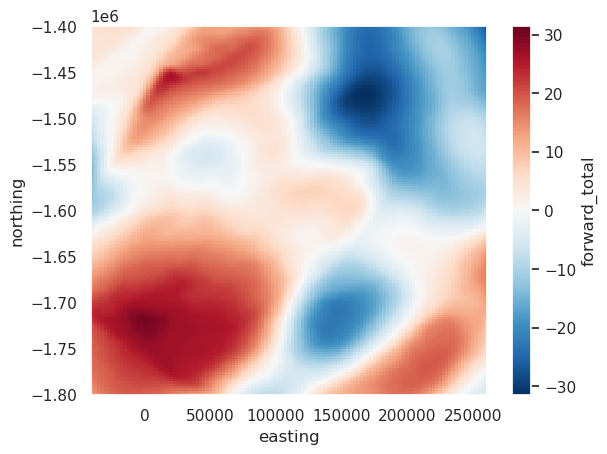

In [82]:
grav_df.set_index(["northing", "easting"]).to_xarray().forward_total.plot()

# Set region and parameters

Use the same regions and parameters as `Ross_Sea synthetic_model.ipynb`

In [71]:
layer_spacing, buffer_region, _, _, registration = polar_utils.get_grid_info(bed)

# set gravity observation parameters
grav_spacing = layer_spacing

inversion_region = vd.pad_region(buffer_region, pad=-40e3)

# set density contrast
density_contrast = 2300 - 1024

print(f"layer spacing: {layer_spacing}m")
print(f"registration: {registration}")
print("inversion region = ", inversion_region)
print("buffer region = ", buffer_region)

layer spacing: 5000.0m
registration: g
inversion region =  (-40000.0, 260000.0, -1800000.0, -1400000.0)
buffer region =  (-80000.0, 300000.0, -1840000.0, -1360000.0)


# Prep grav data
## grav data

In [72]:
grav_df = grav_df.rename(
    columns={
        "forward_total": "Gobs",
    },
)

# remove points outside of region of interest
grav_df = polar_utils.points_inside_region(
    grav_df, region=inversion_region, names=["easting", "northing"]
)

print(f"Gravity data: {len(grav_df)} points")
print(f"gravity avg. elevation: {int(np.nanmean(grav_df.upward))}")

Gravity data: 19481 points
Gravity survey data: 19481 points
gravity avg. elevation: 1000


## constraint points

In [6]:
# load constraint points into a dataframe
constraints_all = pd.read_csv(
    "../../synthetic_data/Ross_Sea_synthetic_constraints_semiregular.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)

# ensure all points are within inversion region
constraints = polar_utils.points_inside_region(
    constraints_all, inversion_region, names=("easting", "northing")
)

print(f"bathymetry control points:{len(constraints)}")
constraints.head()

bathymetry control points:1014


,northing,easting,inside,upward,uncert
624,-1800000.0,-40000.0,False,-461.590276,5.0
625,-1800000.0,-35000.0,False,-444.108731,5.0
626,-1800000.0,-30000.0,False,-423.844966,5.0
627,-1800000.0,-25000.0,False,-421.435285,5.0
628,-1800000.0,-20000.0,False,-402.933554,5.0


## Gravity misfit

The `gravity misfit` is defined as the difference between the observed and predicted gravity:

$G_{misfit} = G_{obs} - G_{forward}$ 

To determine $G_{misfit}$, we need to forward model the gravitational effect of the low-resolution bathymetry density contrast. This will be the input into our inversion.


## Bed prisms

Bathymetry density contrast: 1276kgm-3


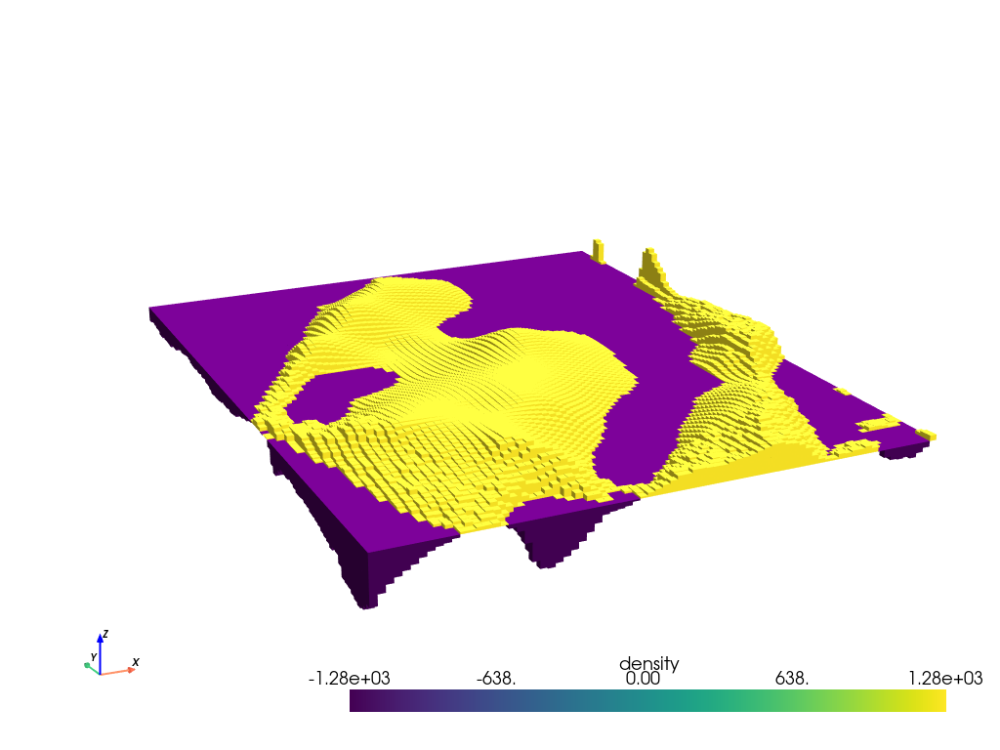

In [7]:
# create prisms around low-res bathymetry
# positive densities above reference, negative below
print(f"Bathymetry density contrast: {density_contrast}kgm-3")

zref = starting_bed.values.mean()

density_grid = xr.where(starting_bed >= zref, density_contrast, -density_contrast)

bed_prisms = utils.grids_to_prisms(
    surface=starting_bed,
    reference=zref,
    density=density_grid,
)

plotting.show_prism_layers(
    [bed_prisms],
    cmap="viridis",
    color_by="density",
    # color_by="thickness",
    zscale=100,
    clip_box=False,
    log_scale=False,
)

## Bed gravity

In [73]:
# calculate gravity of starting bed
grav_df["starting_grav"] = bed_prisms.prism_layer.gravity(
    coordinates=(
        grav_df.easting,
        grav_df.northing,
        grav_df.upward,
    ),
    field="g_z",
    progressbar=True,
)

grav_df

  0%|          | 0/19481 [00:00<?, ?it/s]

  0%|          | 0/19481 [00:00<?, ?it/s]

,northing,easting,basement_grav,bed_grav,Gobs,test,upward,starting_grav
0,-1800000.0,-40000.0,11.710216,1.539514,13.249730,False,1000.0,1.607482
1,-1800000.0,-37500.0,12.137963,2.179606,14.317569,True,1000.0,2.147219
2,-1800000.0,-35000.0,12.534425,2.738843,15.273267,False,1000.0,2.637516
3,-1800000.0,-32500.0,12.885287,3.122398,16.007685,True,1000.0,3.133330
4,-1800000.0,-30000.0,13.203643,3.461204,16.664847,False,1000.0,3.585372
...,...,...,...,...,...,...,...,...
19476,-1400000.0,250000.0,-4.047466,-16.600030,-20.647495,False,1000.0,-16.284757
19477,-1400000.0,252500.0,-5.098004,-16.950135,-22.048139,True,1000.0,-16.809734
19478,-1400000.0,255000.0,-6.188558,-17.320620,-23.509178,False,1000.0,-17.324310
19479,-1400000.0,257500.0,-7.308362,-17.748084,-25.056446,True,1000.0,-17.602190


# Misfit

In [74]:
# calculate misfit as observed - starting
grav_df["misfit"] = grav_df.Gobs - grav_df.starting_grav

grav_df

,northing,easting,basement_grav,bed_grav,Gobs,test,upward,starting_grav,misfit
0,-1800000.0,-40000.0,11.710216,1.539514,13.249730,False,1000.0,1.607482,11.642247
1,-1800000.0,-37500.0,12.137963,2.179606,14.317569,True,1000.0,2.147219,12.170350
2,-1800000.0,-35000.0,12.534425,2.738843,15.273267,False,1000.0,2.637516,12.635752
3,-1800000.0,-32500.0,12.885287,3.122398,16.007685,True,1000.0,3.133330,12.874355
4,-1800000.0,-30000.0,13.203643,3.461204,16.664847,False,1000.0,3.585372,13.079475
...,...,...,...,...,...,...,...,...,...
19476,-1400000.0,250000.0,-4.047466,-16.600030,-20.647495,False,1000.0,-16.284757,-4.362738
19477,-1400000.0,252500.0,-5.098004,-16.950135,-22.048139,True,1000.0,-16.809734,-5.238405
19478,-1400000.0,255000.0,-6.188558,-17.320620,-23.509178,False,1000.0,-17.324310,-6.184868
19479,-1400000.0,257500.0,-7.308362,-17.748084,-25.056446,True,1000.0,-17.602190,-7.454256


### Save and load results

In [75]:
grav_df.to_csv(
    "../../synthetic_data/Ross_Sea_starting_model_forward_gravity.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [76]:
grav_df = pd.read_csv(
    "../../synthetic_data/Ross_Sea_starting_model_forward_gravity.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
grav_df

,northing,easting,basement_grav,bed_grav,Gobs,test,upward,starting_grav,misfit
0,-1800000.0,-40000.0,11.710216,1.539514,13.249730,False,1000.0,1.607482,11.642247
1,-1800000.0,-37500.0,12.137963,2.179606,14.317569,True,1000.0,2.147219,12.170350
2,-1800000.0,-35000.0,12.534425,2.738843,15.273267,False,1000.0,2.637516,12.635752
3,-1800000.0,-32500.0,12.885287,3.122398,16.007685,True,1000.0,3.133330,12.874355
4,-1800000.0,-30000.0,13.203643,3.461204,16.664847,False,1000.0,3.585372,13.079475
...,...,...,...,...,...,...,...,...,...
19476,-1400000.0,250000.0,-4.047466,-16.600030,-20.647495,False,1000.0,-16.284757,-4.362738
19477,-1400000.0,252500.0,-5.098004,-16.950135,-22.048139,True,1000.0,-16.809734,-5.238405
19478,-1400000.0,255000.0,-6.188558,-17.320620,-23.509178,False,1000.0,-17.324310,-6.184868
19479,-1400000.0,257500.0,-7.308362,-17.748084,-25.056446,True,1000.0,-17.602190,-7.454256


# Regional - Residual seperation

Here we seperate the gravity misfit into `regional` and `residual` components. Since we created the synthetic model, we precisely know the regional component (the forward gravity of the `basement` layer), and can thus tune our regional-residual seperation method to accurately remove the regional field. 

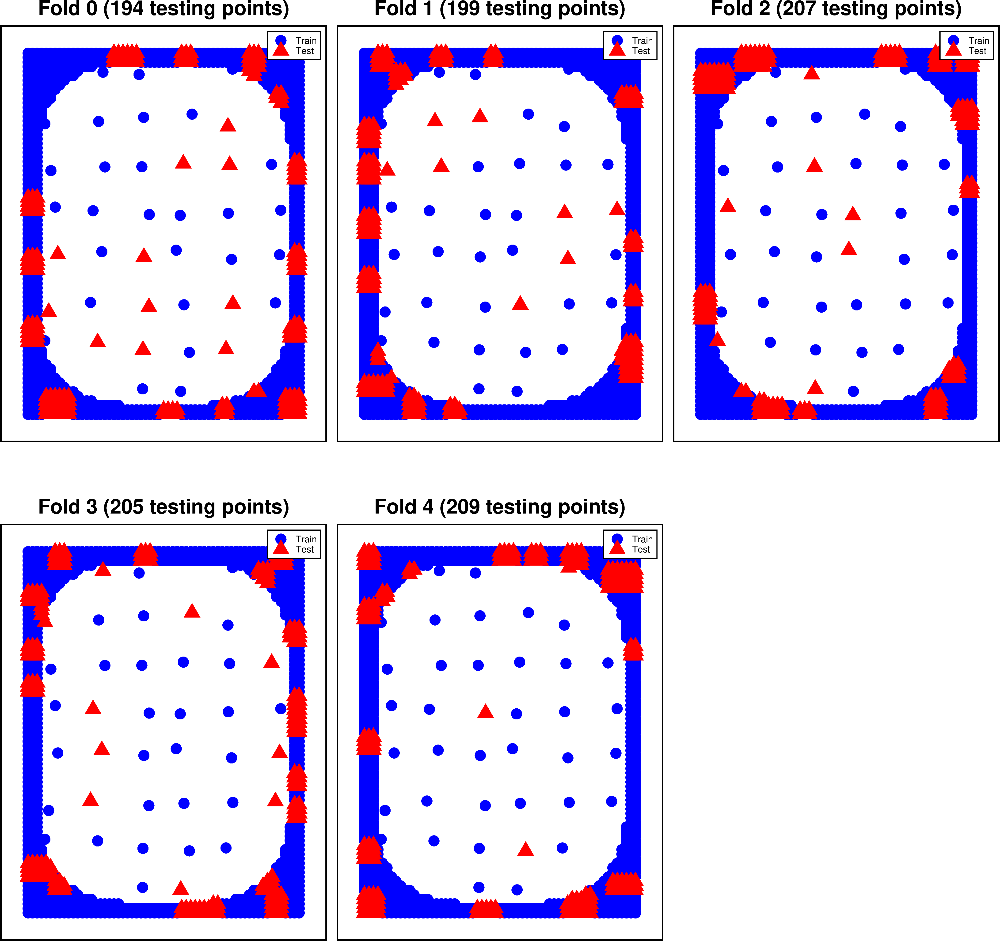

,northing,easting,inside,upward,uncert,fold_0,fold_1,fold_2,fold_3,fold_4
624,-1.800000e+06,-40000.000000,False,-461.590276,5.000000,train,train,train,train,test
625,-1.800000e+06,-35000.000000,False,-444.108731,5.000000,train,train,train,train,test
626,-1.800000e+06,-30000.000000,False,-423.844966,5.000000,train,train,train,train,test
627,-1.800000e+06,-25000.000000,False,-421.435285,5.000000,train,train,train,train,test
628,-1.800000e+06,-20000.000000,False,-402.933554,5.000000,test,train,train,train,train
...,...,...,...,...,...,...,...,...,...,...
3537,-1.728519e+06,87149.318474,True,-285.321083,5.753121,test,train,train,train,train
3538,-1.574530e+06,31910.464776,True,-499.302518,10.079691,train,train,train,test,train
3539,-1.471080e+06,87905.829062,True,-404.874810,8.014692,train,test,train,train,train
3540,-1.623242e+06,238418.430954,True,-551.257892,11.018595,train,train,train,test,train


In [77]:
block_kfold_split_df = cross_validation.split_test_train(
    constraints,
    method="KFold",
    # spacing=spacing,
    shape=(20, 20),
    plot=True,
)
block_kfold_split_df

In [78]:
# values needed in all the regional separation techniques
kwargs = {
    "grav_data_column": "misfit",
    "regional_column": "reg",
    # "score_as_median":True,
    "true_regional": true_regional_grav,
}

Cross-validation folds:   0%|          | 0/5 [00:00<?, ?it/s]

INFO:root:Trial with lowest residual at constraint points: 
INFO:root:	trial number: 282
INFO:root:	parameter: {'source_depth': 71545.03576051258, 'block_size': 1402.4872773064362, 'eq_damping': 0.014680524607964722, 'grav_obs_height': 3564.0217141185167}
INFO:root:	scores: [0.9914737847242604]


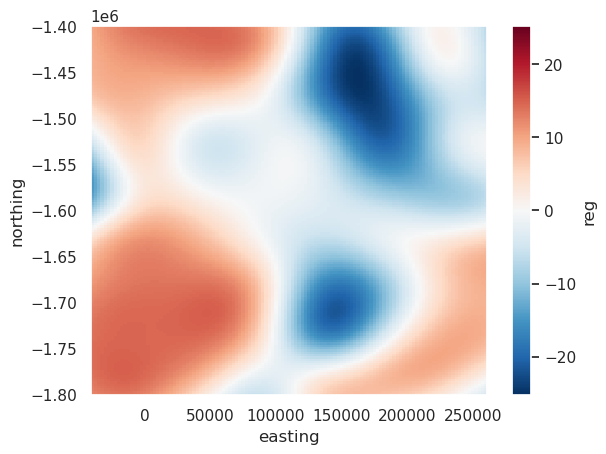

In [14]:
study, grav_df = optimization.optimize_regional_constraint_point_minimization_kfolds(
    block_kfold_split_df,
    grav_df=grav_df,
    grid_method="eq_sources",
    source_depth_limits=[10e3, 200e3],
    block_size_limits=[1e3, 50e3],
    eq_damping_limits=[0, 10],
    grav_obs_height_limits=[0, 50e3],
    n_trials=100,
    plot=True,
    optimize_on_true_regional_misfit=True,
    **kwargs,
)

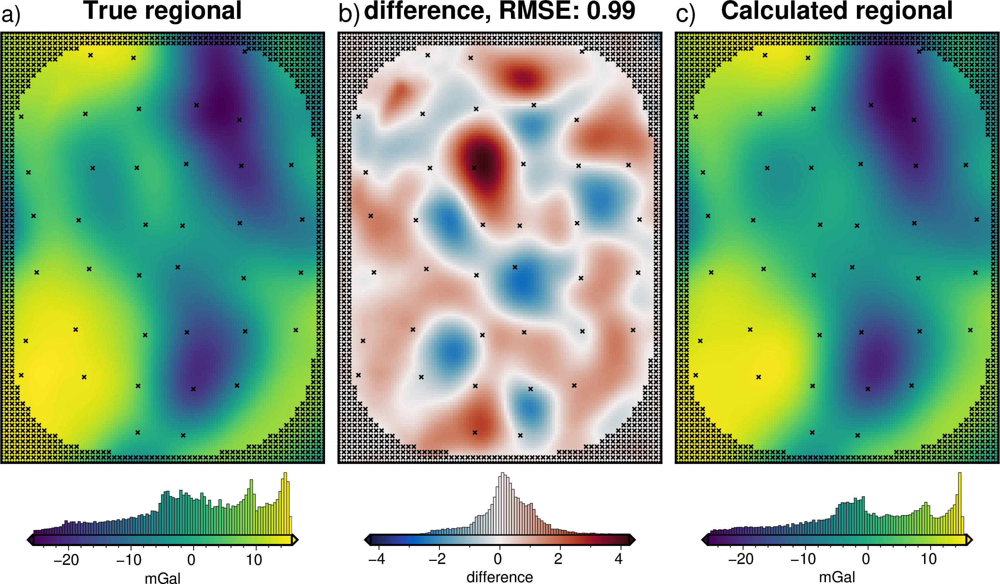

In [ ]:
_ = polar_utils.grd_compare(
    true_regional_grav,
    grav_df.set_index(["northing", "easting"]).to_xarray().reg,
    grid1_name="True regional",
    grid2_name="Calculated regional",
    plot=True,
    region=inversion_region,
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    title="difference",
    plot_type="pygmt",
    hist=True,
    inset=False,
    points_style="x.15c",
    subplot_labels=True,
    robust=False,
    verbose="q",
    cbar_label="mGal",
)

Cross-validation folds:   0%|          | 0/5 [00:00<?, ?it/s]

INFO:root:Number of trials on the Pareto front: 90
INFO:root:Trial with lowest residual at constraint points: 
INFO:root:	trial number: 208
INFO:root:	parameter: {'source_depth': 33518.609590264234, 'eq_damping': 0.10161705739041182}
INFO:root:	scores: [0.7708652162234105, 2.2606131075294513]


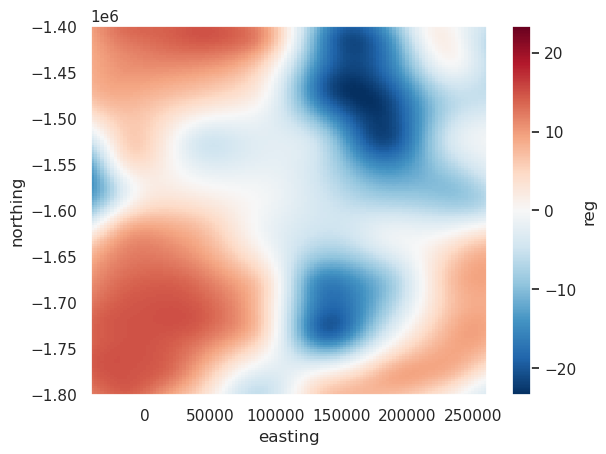

In [16]:
study, grav_df = optimization.optimize_regional_constraint_point_minimization_kfolds(
    block_kfold_split_df,
    grav_df=grav_df,
    grid_method="eq_sources",
    source_depth_limits=[10e3, 200e3],
    eq_damping_limits=[0, 10],
    # if limits are omitted, must provide constant values
    block_size=10e3,
    grav_obs_height=20e3,
    n_trials=100,
    plot=True,
    # optimize_on_true_regional_misfit=True,
    **kwargs,
)

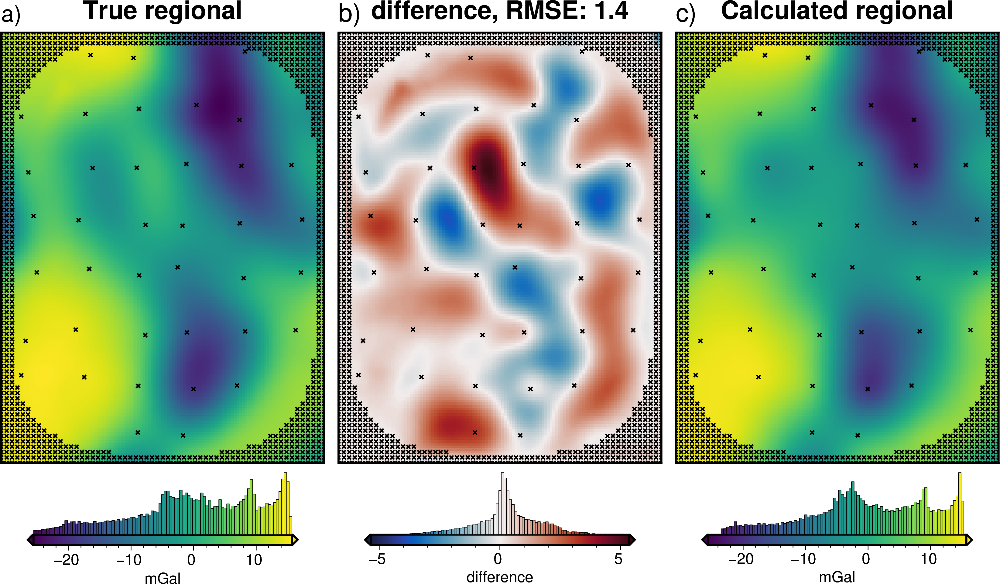

In [ ]:
_ = polar_utils.grd_compare(
    true_regional_grav,
    grav_df.set_index(["northing", "easting"]).to_xarray().reg,
    grid1_name="True regional",
    grid2_name="Calculated regional",
    plot=True,
    region=inversion_region,
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    title="difference",
    plot_type="pygmt",
    hist=True,
    inset=False,
    points_style="x.15c",
    subplot_labels=True,
    robust=False,
    verbose="q",
    cbar_label="mGal",
)

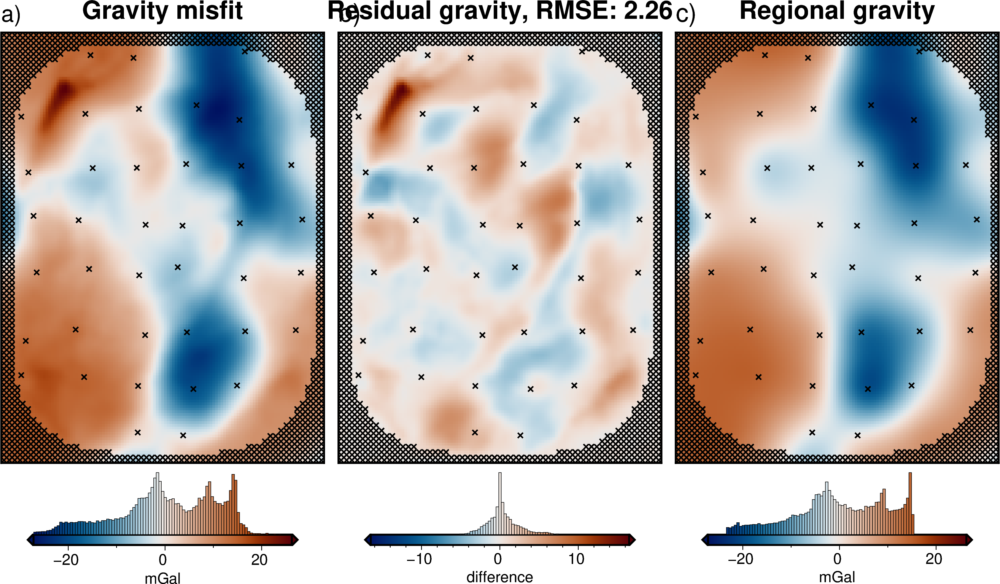

In [18]:
_ = RIS_plotting.anomalies_plotting(
    grav_df,
    title=" Constraint Point Minimization Regional Separation",
    constraints=constraints.rename(columns={"easting": "x", "northing": "y"}),
    input_forward_column="starting_grav",
    input_grav_column="Gobs",
    plot_type="pygmt",
    robust=False,
)

### Save and load results

In [19]:
grav_df.to_csv(
    "../../synthetic_data/Ross_Sea_gravity_anomalies.csv.gz",
    sep=",",
    na_rep="",
    header=True,
    index=False,
    encoding="utf-8",
    compression="gzip",
)

In [20]:
grav_df = pd.read_csv(
    "../../synthetic_data/Ross_Sea_gravity_anomalies.csv.gz",
    sep=",",
    header="infer",
    index_col=None,
    compression="gzip",
)
grav_df

,northing,easting,basement_grav,bed_grav,Gobs,test,upward,starting_grav,misfit,reg,res
0,-1800000.0,-40000.0,11.710216,1.539514,13.249730,False,1000.0,1.607482,11.642247,12.095972,-0.453725
1,-1800000.0,-37500.0,12.137963,2.179606,14.317569,True,1000.0,2.147219,12.170350,12.369271,-0.198921
2,-1800000.0,-35000.0,12.534425,2.738843,15.273267,False,1000.0,2.637516,12.635752,12.634746,0.001006
3,-1800000.0,-32500.0,12.885287,3.122398,16.007685,True,1000.0,3.133330,12.874355,12.888008,-0.013653
4,-1800000.0,-30000.0,13.203643,3.461204,16.664847,False,1000.0,3.585372,13.079475,13.123684,-0.044209
...,...,...,...,...,...,...,...,...,...,...,...
19476,-1400000.0,250000.0,-4.047466,-16.600030,-20.647495,False,1000.0,-16.284757,-4.362738,-3.118559,-1.244180
19477,-1400000.0,252500.0,-5.098004,-16.950135,-22.048139,True,1000.0,-16.809734,-5.238405,-3.633574,-1.604831
19478,-1400000.0,255000.0,-6.188558,-17.320620,-23.509178,False,1000.0,-17.324310,-6.184868,-4.097098,-2.087770
19479,-1400000.0,257500.0,-7.308362,-17.748084,-25.056446,True,1000.0,-17.602190,-7.454256,-4.500786,-2.953469


# Constraints grid

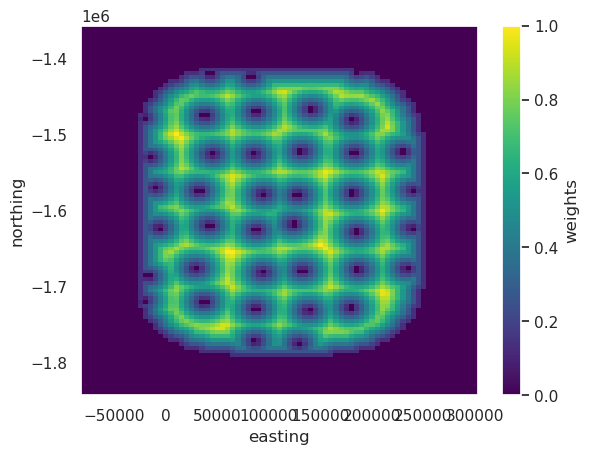

In [21]:
starting_prisms = copy.deepcopy(bed_prisms)

min_dist = utils.normalized_mindist(
    constraints,
    starting_prisms,
    mindist=layer_spacing / np.sqrt(2),
    low=0,
    high=1,
    region=inversion_region,
)
starting_prisms["weights"] = min_dist
starting_prisms.weights.plot()

In [22]:
enc = {x: {"compressor": zarr.Blosc()} for x in starting_prisms}
starting_prisms.to_zarr(
    "../../inversion_layers/Ross_Sea_starting_prisms.zarr",
    encoding=enc,
    mode="w",
)

In [23]:
starting_prisms = xr.open_zarr(
    "../../inversion_layers/Ross_Sea_starting_prisms.zarr",
)

# Inversion

Now that we have $G_{misfit}$, we can run an inversion to attempt to recover the true bathymetry. 

In [29]:
# set Python's logging level
logger = logging.getLogger()
logger.setLevel(logging.WARNING)

# set kwargs to pass to the inversion
kwargs = {
    "grav_data_column": "Gobs",
    "prism_layer": starting_prisms,
    "deriv_type": "annulus",
    # set stopping criteria
    "max_iterations": 100,
    "l2_norm_tolerance": 0.01,
    "delta_l2_norm_tolerance": 1.02,
}

# set which damping parameters to include
dampings = np.logspace(-3, 0, 8)

best_inv_results, best_damping, _, _, scores = cross_validation.grav_optimal_parameter(
    training_data=grav_df[grav_df.test == False],
    testing_data=grav_df[grav_df.test == True],
    param_to_test=("solver_damping", dampings),
    progressbar=True,
    # plot_grids=True,
    plot_cv=False,
    verbose=True,
    **kwargs,
)

solver_damping values:   0%|          | 0/8 [00:00<?, ?it/s]

INFO:root:solver_damping value: 0.01 -> Score: 0.011988991815006875
INFO:root:solver_damping value: 0.013894954943731374 -> Score: 0.011946141121599573
INFO:root:solver_damping value: 0.019306977288832496 -> Score: 0.01219927176056072
INFO:root:solver_damping value: 0.02682695795279726 -> Score: 0.012200149552419102
INFO:root:solver_damping value: 0.0372759372031494 -> Score: 0.012223935270835342
INFO:root:solver_damping value: 0.0517947467923121 -> Score: 0.012223700098014175
INFO:root:solver_damping value: 0.07196856730011521 -> Score: 0.012766314827296628
INFO:root:solver_damping value: 0.1 -> Score: 0.023967776009381977
INFO:root:Best score of 0.011946141121599573 with solver_damping=0.013894954943731374


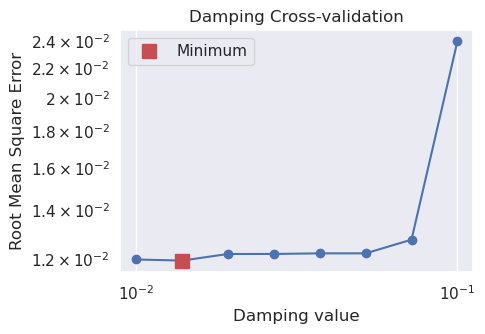

In [30]:
# Compare the scores and the damping values
plotting.plot_cv_scores(
    scores,
    dampings,
    param_name="Damping",
    logx=True,
    logy=True,
)

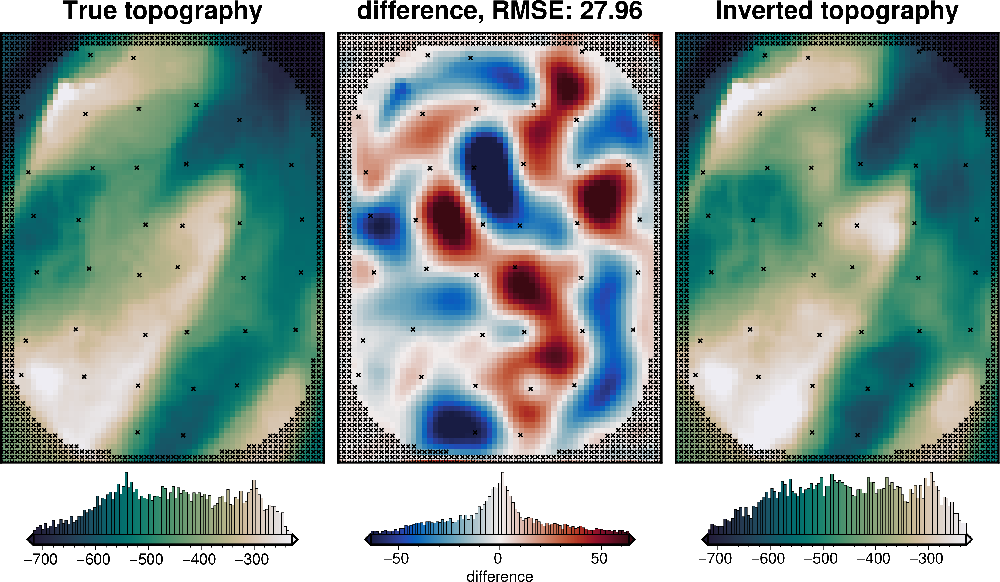

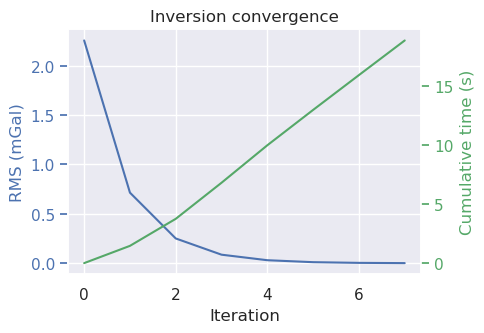

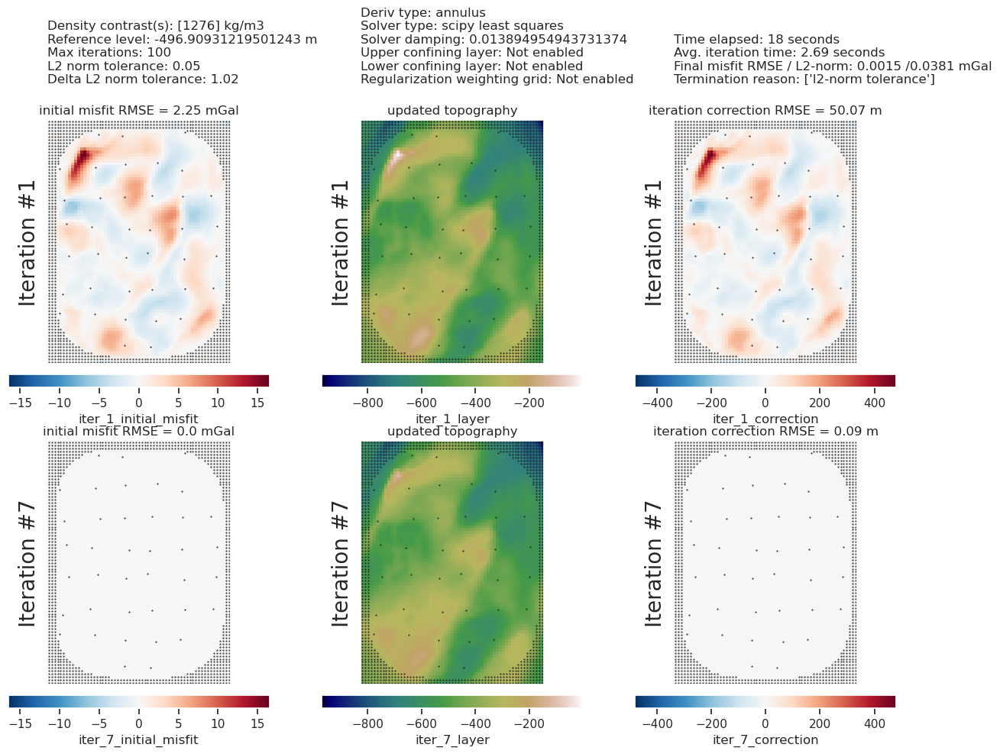

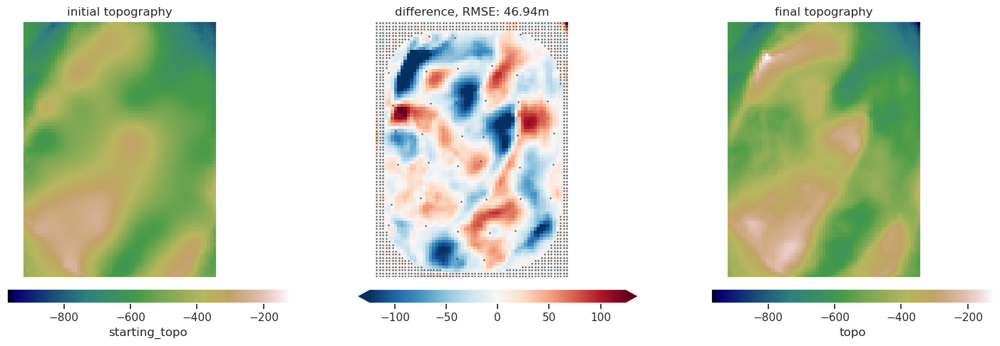

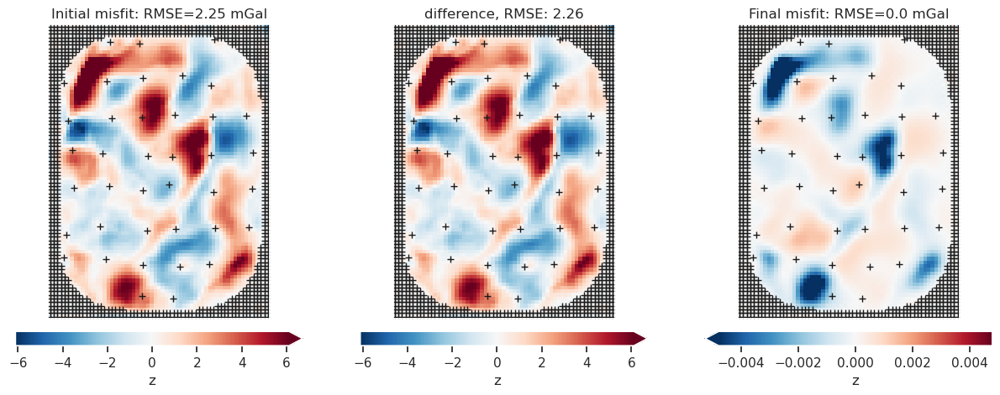

In [35]:
# collect the results
topo_results, grav_results, parameters, elapsed_time = best_inv_results

plotting.plot_convergence(
    grav_results,
    iter_times=parameters["Iteration times"],
)

plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
    constraints_df=constraints,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bed,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.15c",
)

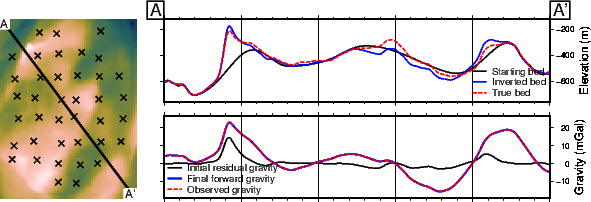

In [ ]:
RIS_plotting.plot_inversion_results_profile(
    topo_results,
    grav_results,
    observed_grav_column="Gobs",
    constraints=constraints[constraints.inside],
    true_surface=bed,
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    map_buffer=0.02,
    subplot_orientation="horizontal",
    data_legend_loc="jBL+o0c",
    layers_legend_loc="jBR+o0c",
    layers_frame=["nEsw", "xafg", "ya+lElevation (m)"],
    data_frame=["nEsw", "xafg", "ya+lGravity (mGal)"],
)

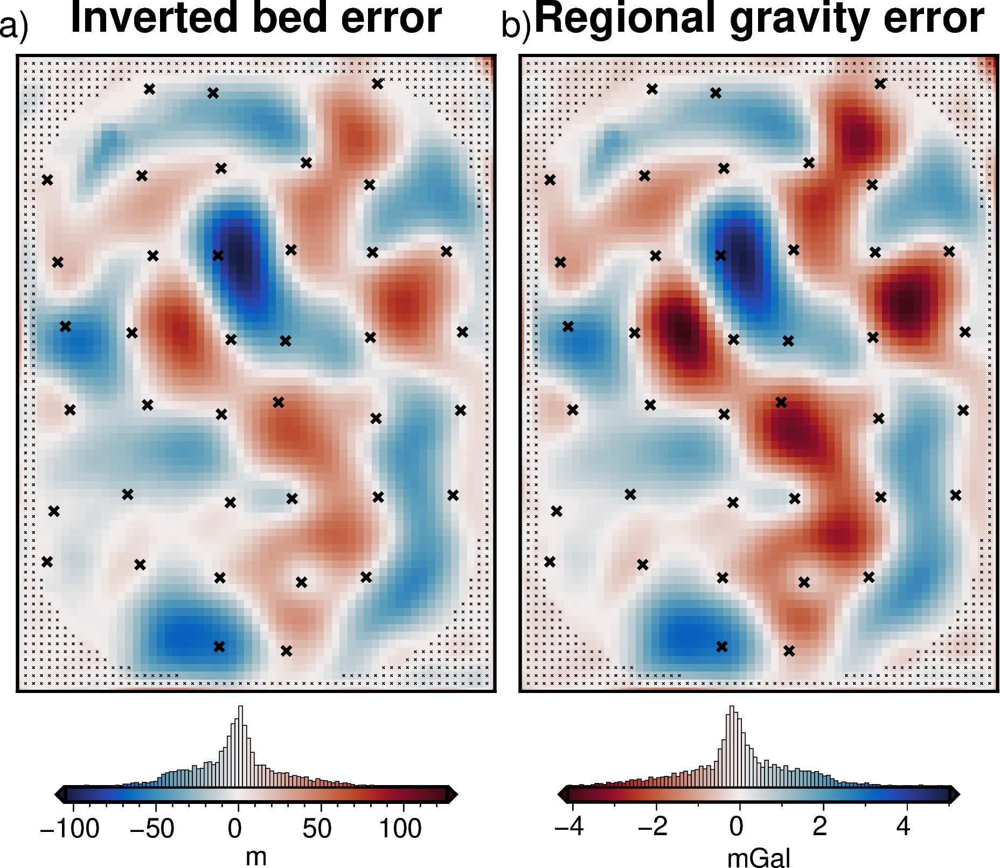

In [43]:
# inverted bed error
final_topography = final_topography.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
true_bed = bed.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)
bed_dif = true_bed - final_topography

# regional separation error
ds = (
    grav_results[grav_results.test == False]
    .set_index(["northing", "easting"])
    .to_xarray()
)
true_reg = true_regional_grav
reg_dif = true_reg - ds.reg
reg_dif -= np.nanmean(reg_dif)

fig = maps.plot_grd(
    bed_dif,
    fig_height=10,
    title="Inverted bed error",
    hist=True,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
    cmap="balance+h0",
    cbar_label="m",
    cbar_yoffset=1.5,
)
fig.text(
    position="TL",
    justify="BL",
    text="a)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)

fig = maps.plot_grd(
    reg_dif,
    title="Regional gravity error",
    cmap="balance+h0",
    reverse_cpt=True,
    fig=fig,
    hist=True,
    points=constraints[constraints.inside].rename(
        columns={"easting": "x", "northing": "y"}
    ),
    points_style="x.2c",
    points_pen="1.5p",
    origin_shift="xshift",
    cbar_label="mGal",
    cbar_yoffset=1.5,
)

fig.text(
    position="TL",
    justify="BL",
    text="b)",
    font="16p,Helvetica,black",
    offset="j-.3/.3",
    no_clip=True,
)
fig.plot(
    x=constraints[constraints.inside == False].easting,
    y=constraints[constraints.inside == False].northing,
    style="x.05c",
)
fig.show()

### Repeat with noise

INFO:root:Standard deviation used for noise: [0.6307378066287668]


Cross-validation folds:   0%|          | 0/5 [00:00<?, ?it/s]

INFO:root:Number of trials on the Pareto front: 85
INFO:root:Trial with lowest residual at constraint points: 
INFO:root:	trial number: 303
INFO:root:	parameter: {'source_depth': 43117.062807417955, 'eq_damping': 0.7004898263949966}
INFO:root:	scores: [1.042798152639004, 2.3801469194687206]


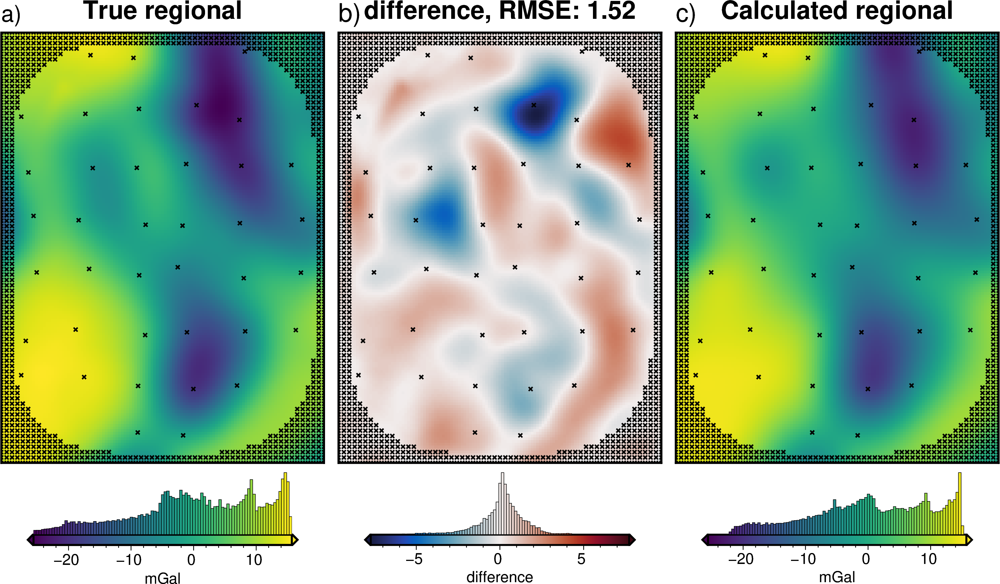

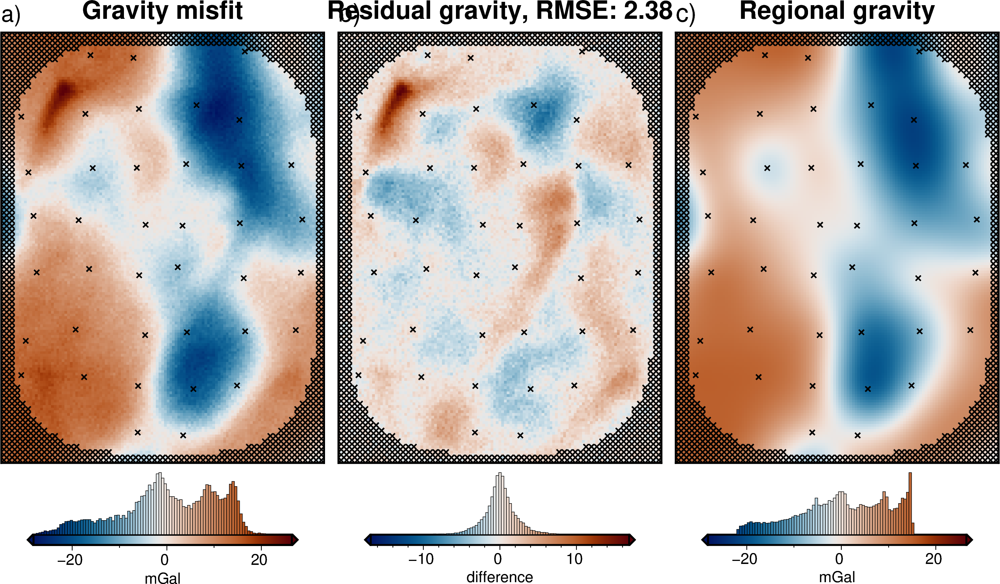

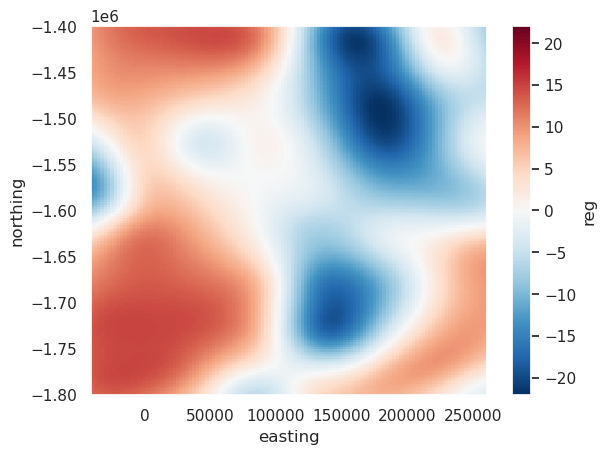

In [ ]:
# contaminate with noise
grav_df_noise = grav_df.copy()
grav_df_noise["Gobs"], _ = synthetic.contaminate(
    grav_df_noise.Gobs,
    stddev=0.02,
    percent=True,
    seed=0,
)
# calculate misfit as observed - starting
grav_df_noise["misfit"] = grav_df_noise.Gobs - grav_df_noise.starting_grav

# values for regional separation
kwargs = {
    "grav_df": grav_df_noise,
    "grav_data_column": "misfit",
    "regional_column": "reg",
    # "score_as_median":True,
    "true_regional": true_regional_grav,
}

study, grav_df_noise = (
    optimization.optimize_regional_constraint_point_minimization_kfolds(
        block_kfold_split_df,
        grid_method="eq_sources",
        source_depth_limits=[10e3, 200e3],
        eq_damping_limits=[0, 10],
        # if limits are omitted, must provide constant values
        block_size=10e3,
        grav_obs_height=20e3,
        n_trials=100,
        plot=True,
        # optimize_on_true_regional_misfit=True,
        **kwargs,
    )
)

_ = polar_utils.grd_compare(
    true_regional_grav,
    grav_df_noise.set_index(["northing", "easting"]).to_xarray().reg,
    grid1_name="True regional",
    grid2_name="Calculated regional",
    plot=True,
    region=inversion_region,
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    title="difference",
    plot_type="pygmt",
    hist=True,
    inset=False,
    points_style="x.15c",
    subplot_labels=True,
    robust=False,
    verbose="q",
    cbar_label="mGal",
)

_ = RIS_plotting.anomalies_plotting(
    grav_df_noise,
    title=" Constraint Point Minimization Regional Separation",
    constraints=constraints.rename(columns={"easting": "x", "northing": "y"}),
    input_forward_column="starting_grav",
    input_grav_column="Gobs",
    plot_type="pygmt",
    robust=False,
)

INFO:root:solver_damping value: 0.001 -> Score: 2.1127700953738704
INFO:root:solver_damping value: 0.0026826957952797246 -> Score: 1.6623005161903126
INFO:root:solver_damping value: 0.0071968567300115215 -> Score: 0.760610536851631
INFO:root:solver_damping value: 0.019306977288832496 -> Score: 0.76060806021913
INFO:root:solver_damping value: 0.0517947467923121 -> Score: 0.76054211092535
INFO:root:solver_damping value: 0.13894954943731375 -> Score: 0.7621971514203284
INFO:root:solver_damping value: 0.3727593720314938 -> Score: 2.341543620551365
INFO:root:solver_damping value: 1.0 -> Score: 2.3817033281896074
INFO:root:Best score of 0.76054211092535 with solver_damping=0.0517947467923121
INFO:root:Damping CV finished with best value found of 0.0517947467923121. Using this value with the zref/density CV.


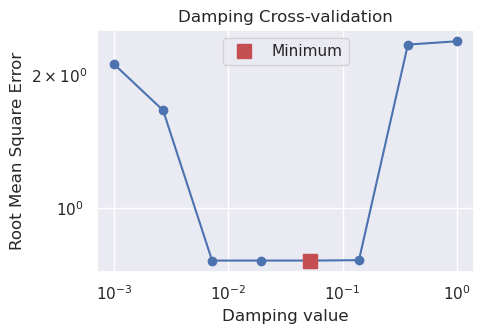

In [67]:
logger = logging.getLogger()
logger.setLevel(logging.WARNING)

# set kwargs to pass to the inversion
kwargs = {
    "starting_prisms": starting_prisms,
    "grav_data_column": "Gobs",
    "deriv_type": "annulus",
    # set stopping criteria
    "max_iterations": 100,
    "l2_norm_tolerance": 0.15,
    "delta_l2_norm_tolerance": 1.02,
}

# run the inversion workflow, including a cross validation for the damping parameter
results = inversion.run_inversion_workflow(
    grav_df=grav_df_noise,
    run_damping_cv=True,
    damping_values=np.logspace(-3, 0, 8),
    plot_cv=True,
    cv_progressbar=True,
    **kwargs,
)

# collect the results
topo_results, grav_results, parameters, elapsed_time = results

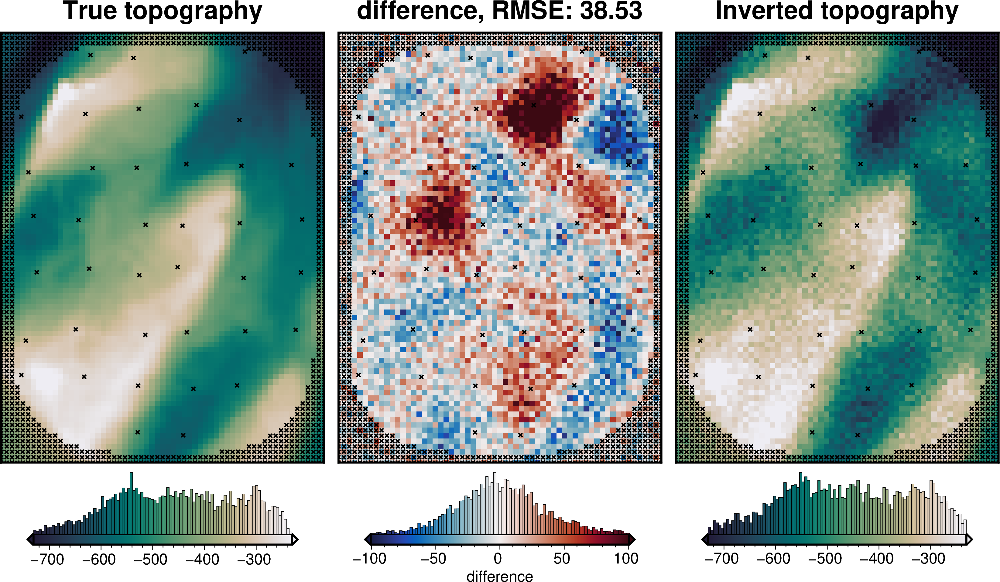

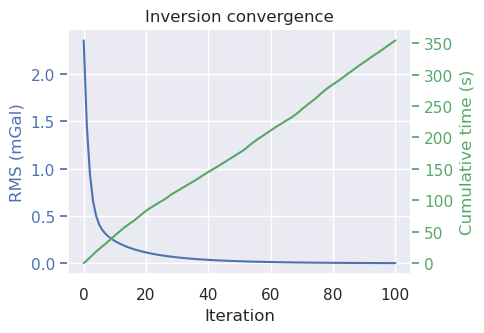

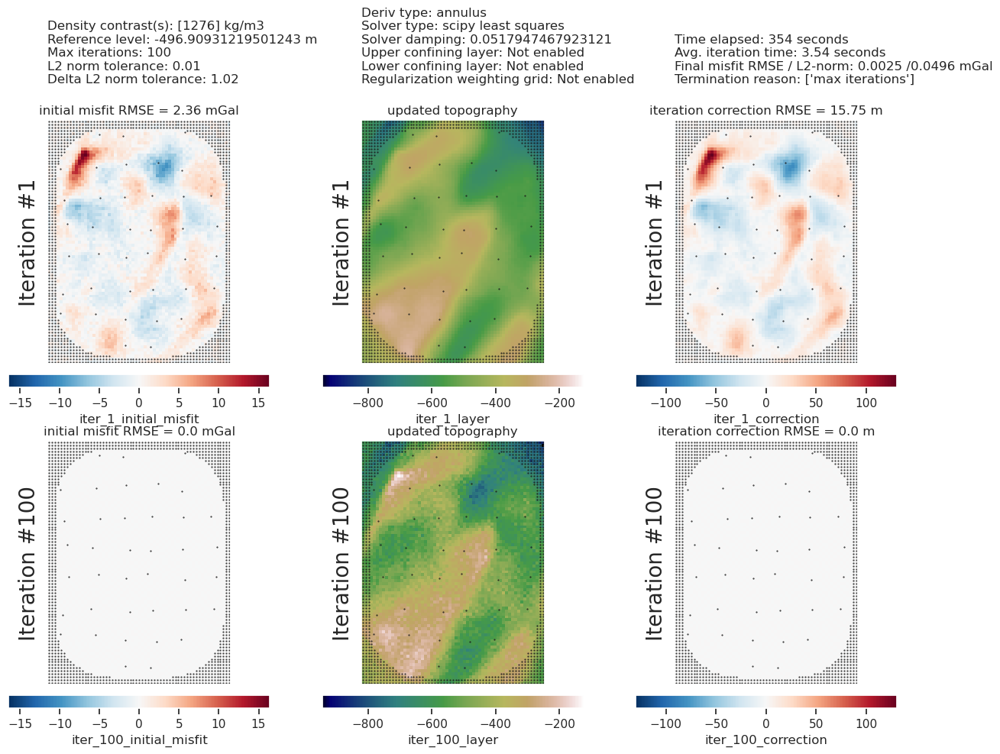

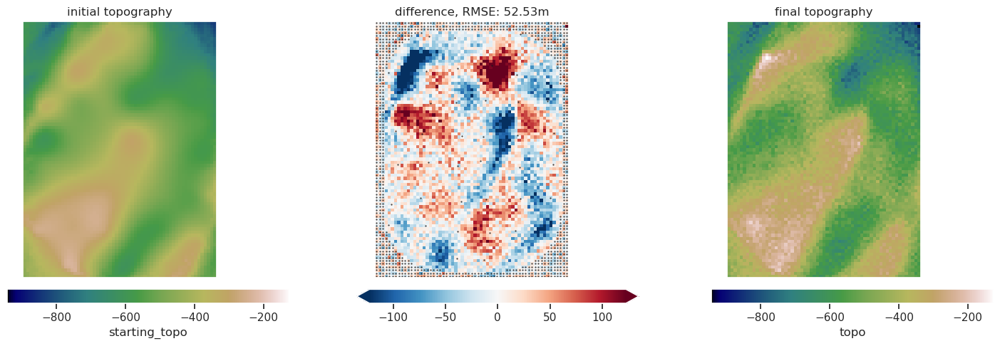

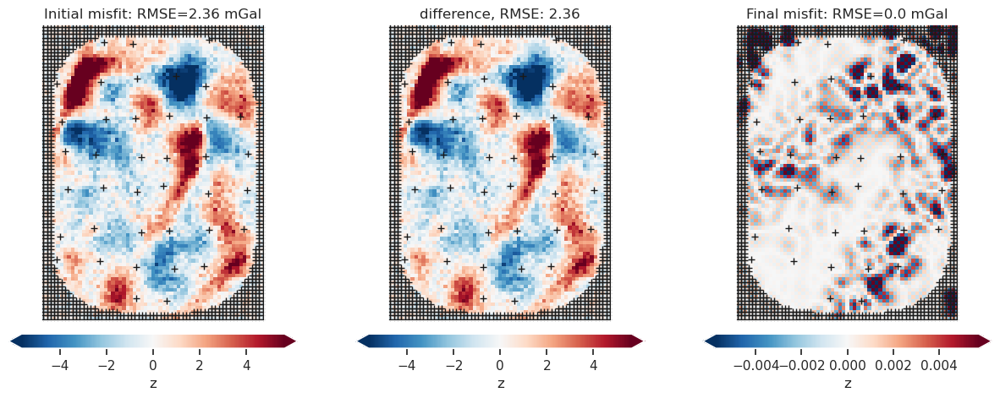

In [68]:
# collect the results
topo_results, grav_results, parameters, elapsed_time = results

plotting.plot_convergence(
    grav_results,
    iter_times=parameters["Iteration times"],
)

plotting.plot_inversion_results(
    grav_results,
    topo_results,
    parameters,
    inversion_region,
    iters_to_plot=2,
    plot_iter_results=True,
    plot_topo_results=True,
    plot_grav_results=True,
    constraints_df=constraints,
)

final_topography = topo_results.set_index(["northing", "easting"]).to_xarray().topo

_ = polar_utils.grd_compare(
    bed,
    final_topography,
    region=inversion_region,
    plot=True,
    grid1_name="True topography",
    grid2_name="Inverted topography",
    robust=True,
    hist=True,
    inset=False,
    verbose="q",
    title="difference",
    grounding_line=False,
    reverse_cpt=True,
    cmap="rain",
    points=constraints.rename(columns={"easting": "x", "northing": "y"}),
    points_style="x.15c",
)

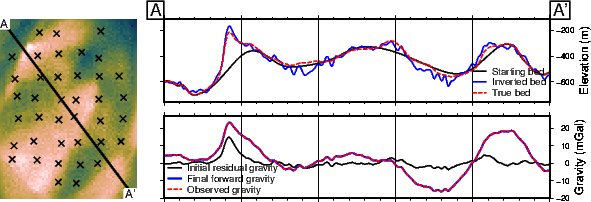

In [ ]:
RIS_plotting.plot_inversion_results_profile(
    topo_results,
    grav_results,
    observed_grav_column="Gobs",
    constraints=constraints[constraints.inside],
    true_surface=bed,
    start=[inversion_region[0], inversion_region[3]],
    stop=[inversion_region[1], inversion_region[2]],
    map_buffer=0.02,
    subplot_orientation="horizontal",
    data_legend_loc="jBL+o0c",
    layers_legend_loc="jBR+o0c",
    layers_frame=["nEsw", "xafg", "ya+lElevation (m)"],
    data_frame=["nEsw", "xafg", "ya+lGravity (mGal)"],
)